In [ ]:
NAME = "Udoy Saha, Md Faisal"
ID = "23341134"
COLLABORATORS_ID = "21301620"

# Necessary library import


In [ ]:
import numpy as np
from skimage import io, color, exposure, img_as_float, transform
import matplotlib.pyplot as plt
import random

# Task 1 - Basic Image Operation


import your image or any photo taken by you (`sample.jpeg`) as a numpy array, save it in the varaible `I`.

A picture taken from your phone of any scenary/streets/building is better.

remember your image name MUST be `sample.jpeg`.

Make sure the height and the width of the image is **smaller than 1000 pixels**.


Height is 1000
Width is 1600


Image has been scaled
Height is 625
Width is 1000


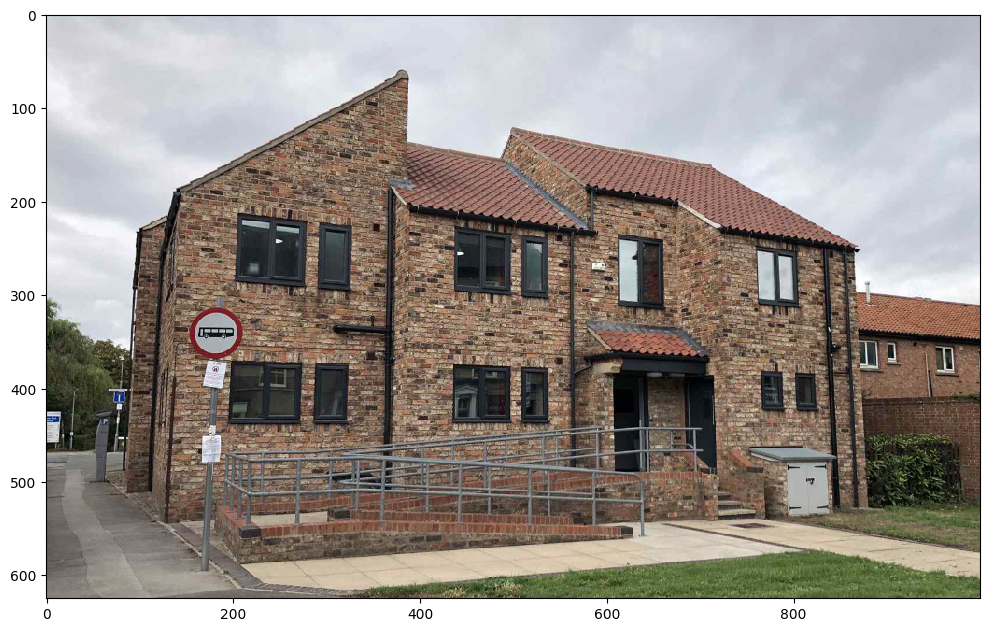

In [ ]:
I = io.imread("/content/sample.jpeg") # Replace None with appropriate function call line

# find the height and the width of the image
H = I.shape[0] # should contain height
W = I.shape[1] # should contain width
print("Height is", H)
print("Width is", W)

### BEGIN SOLUTION
UPPER_BOUND = 1000
if H > UPPER_BOUND or W > UPPER_BOUND:
  I = transform.rescale(I, UPPER_BOUND/max(H, W), anti_aliasing=True, channel_axis=-1)
  H = I.shape[0]
  W = I.shape[1]
  I = (I * 255).astype('uint8')

  print("\n\nImage has been scaled")
  print("Height is", H)
  print("Width is", W)

io.imshow(I)
### END SOLUTION

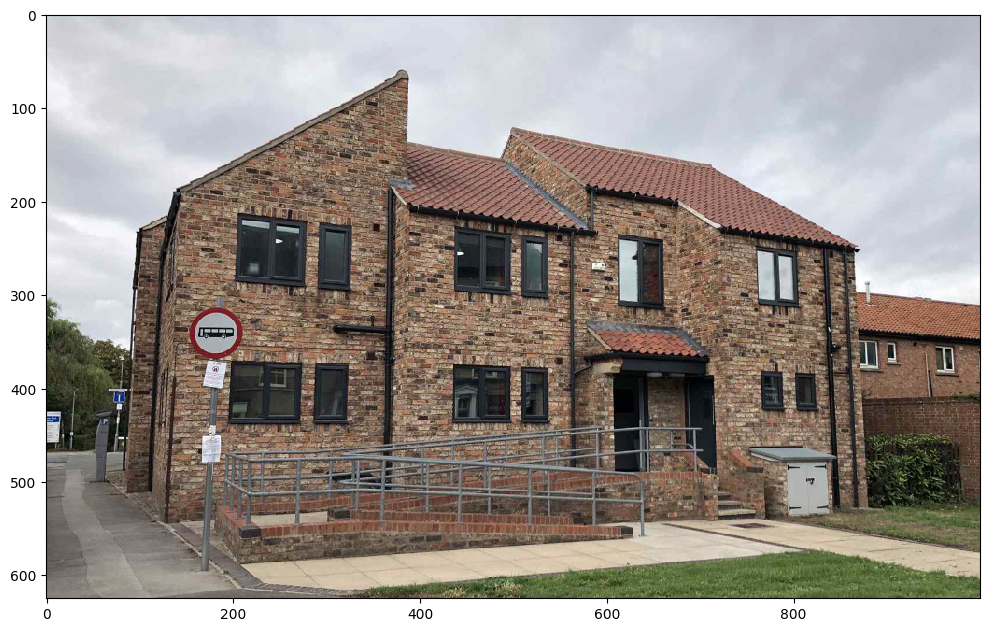

In [ ]:
# Normalize the image so that the gray scales are between 0 and 1. Save it to I and display the image
I = I/255

### BEGIN SOLUTION
io.imshow(I)
### END SOLUTION

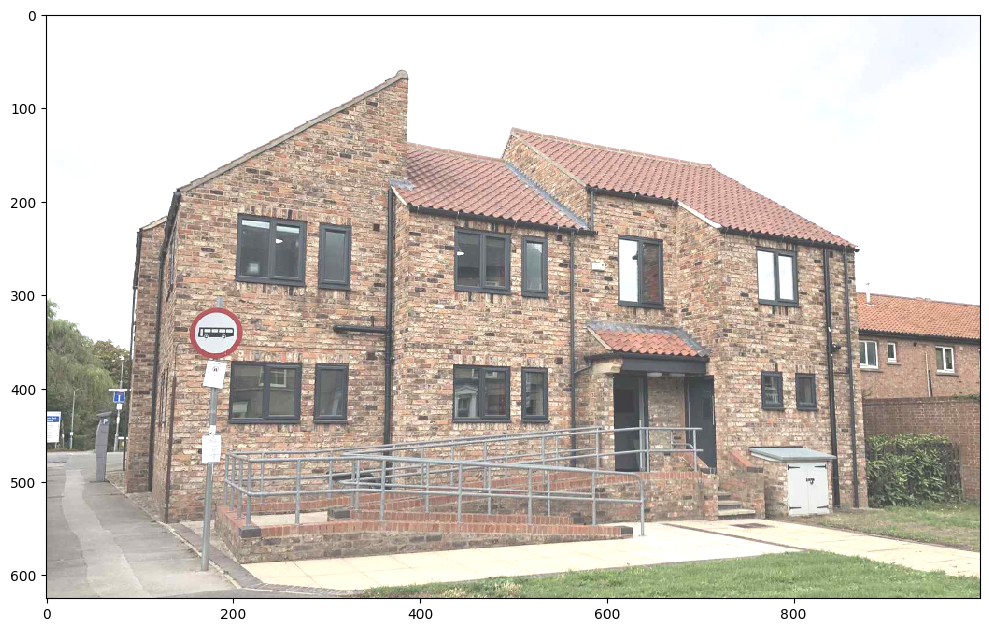

In [ ]:
# Increase the brightness of the image without changing the contrast.
# Save the resulting image in I_bright and display it.
I_bright = np.clip(I + 0.25, 0, 1)

### BEGIN SOLUTION
io.imshow(I_bright)
### END SOLUTION

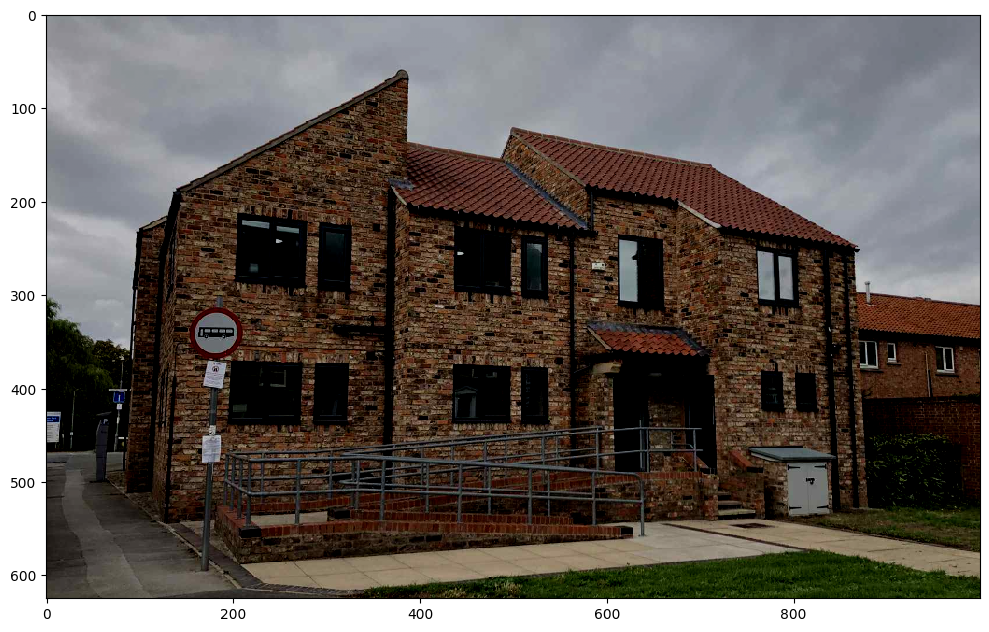

In [ ]:
# Decrease the brightness of the image without changing the contrast.
# Save the resulting image in I_dark and display it.
I_dark = np.clip(I - 0.25, 0, 1)

### BEGIN SOLUTION
io.imshow(I_dark)
### END SOLUTION

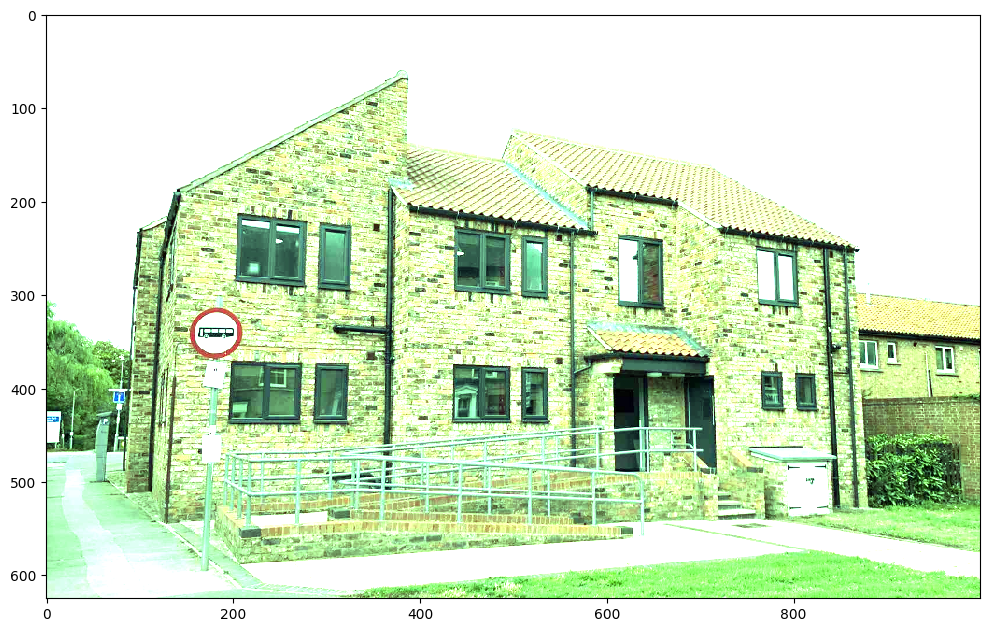

In [ ]:
# Multiply the three channels of image I with three DIFFERENT numbers between 0.3 and 3
# Save the resulting image in I_tint and display it.
# The resulting image should have some color shift
I_tint = np.zeros(I.shape)

### BEGIN SOLUTION
for i in range(3):
  I_tint[:, :, i] = np.clip(I[:, :, i] * random.uniform(0.3, 3), 0, 1)

io.imshow(I_tint)
### END SOLUTION

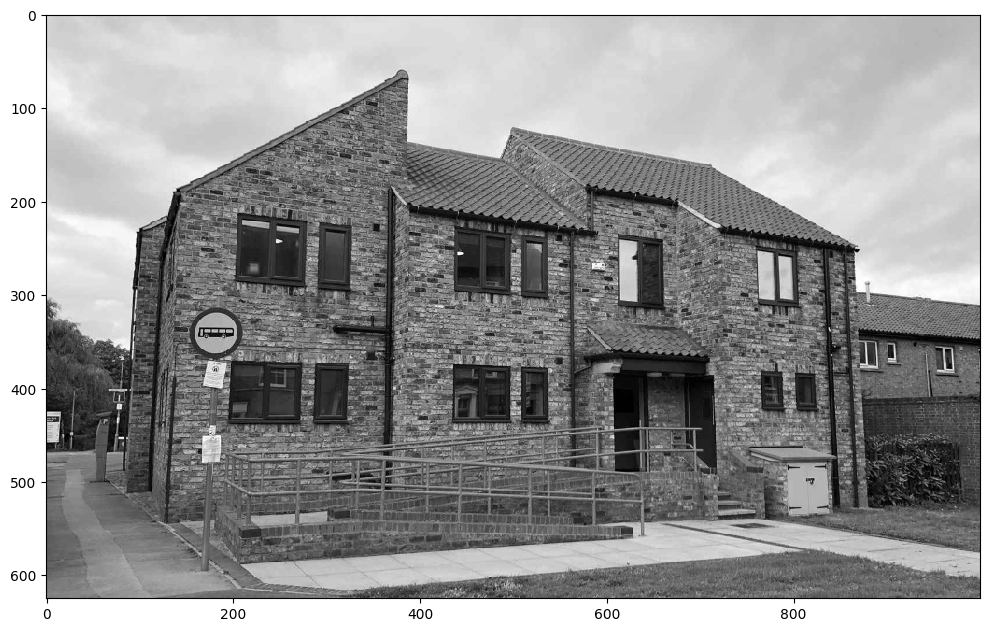

In [ ]:
# Convert the image into a grayscale image.
# Save it to I_gray and display it
I_gray = color.rgb2gray(I)

### BEGIN SOLUTION
io.imshow(I_gray)
### END SOLUTION

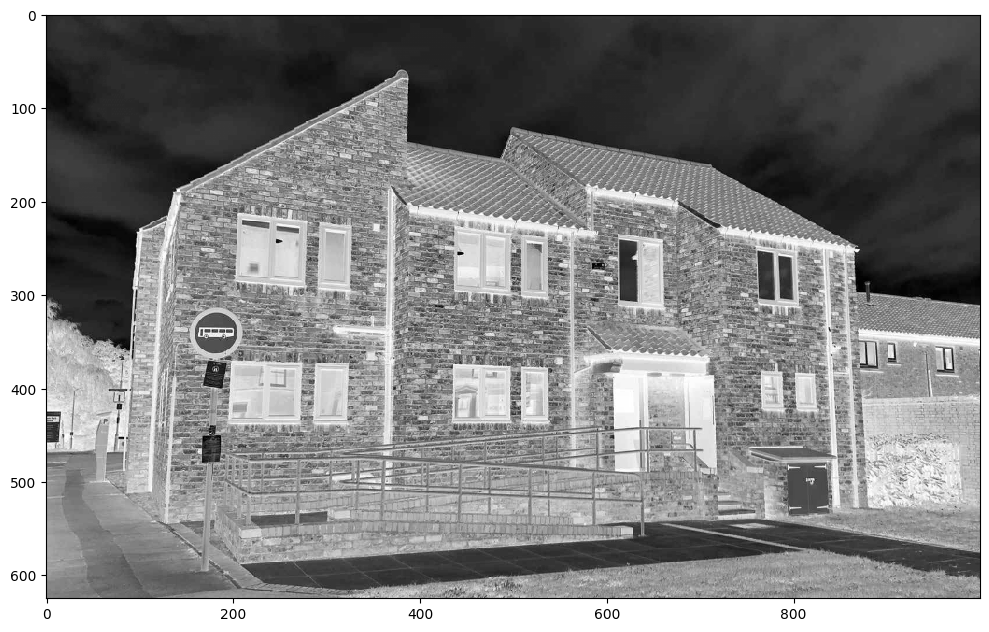

In [ ]:
# Display the negative of the grayscale image

### BEGIN SOLUTION
io.imshow(1 - I_gray)
### END SOLUTION

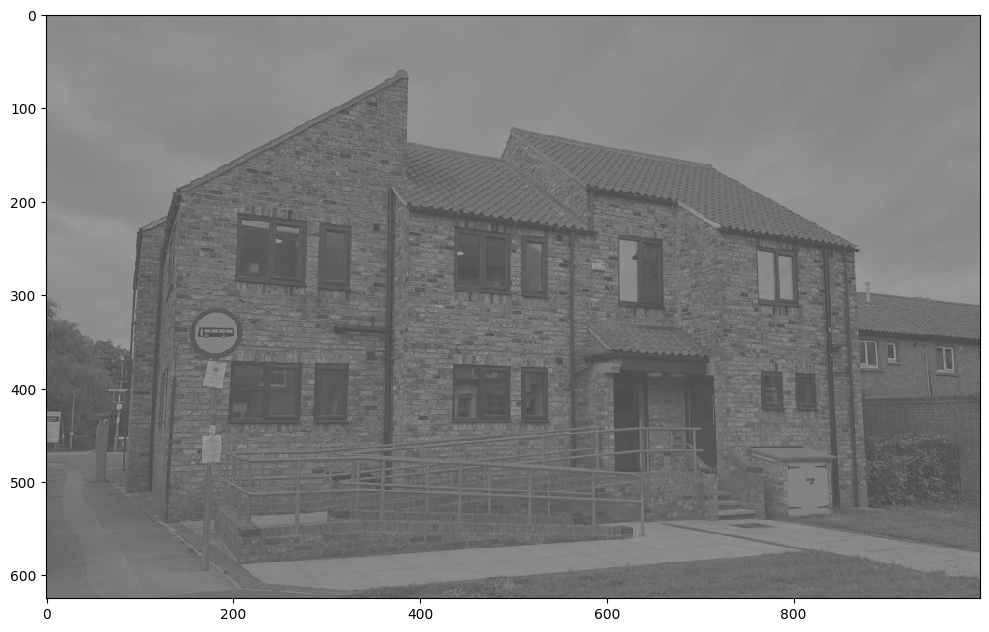

In [ ]:
# Artificially degrade the **grayscale image** by reducing it contrast
# You can do so by recaling the gray values and concentrating them in a narrow range,
# say between 0.3 and 0.6.
# Save the image as I_degraded and display it
# HINT: SEE lec-4-demo-codes

I_degraded = (I_gray - I_gray.min()) / (I_gray.max() - I_gray.min())  # Image stretched to full range from 0 to 1

### BEGIN SOLUTION
range_low, range_high = 0.3, 0.6
I_degraded *= range_high - range_low  # concentrating to desired interval
I_degraded += range_low

io.imshow(I_degraded)
### END SOLUTION

In [ ]:
# Complete the following function to perform Piecewise Linear Contrast stretching
# That is, implement the map shown in Slide 17 of Lecture 3

# Prototype: piecewise_contrast_stretch(I_gray, r1, r2, s1, s2)
# Assuming both input and output images are normalized between 0 and 1

def piecewise_contrast_stretch(I, r1, r2, s1, s2):
    # Write your code here
    I_stretched = I.copy()

    ### BEGIN SOLUTION
    # first region
    I_stretched[I_stretched < r1] = (s1/r1) * I_stretched[I_stretched < r1]

    # second region
    I_stretched[(I_stretched >= r1) & (I_stretched < r2)] = s1 + ((I_stretched[(I_stretched >= r1) & (I_stretched < r2)] - r1) * (s2 - s1) / (r2 - r1))

    # third region
    I_stretched[r2 <= I_stretched] = s2 + ((I_stretched[r2 <= I_stretched] - r2) * (1 - s2) / (1 - r2))

    return I_stretched
    ### END SOLUTION



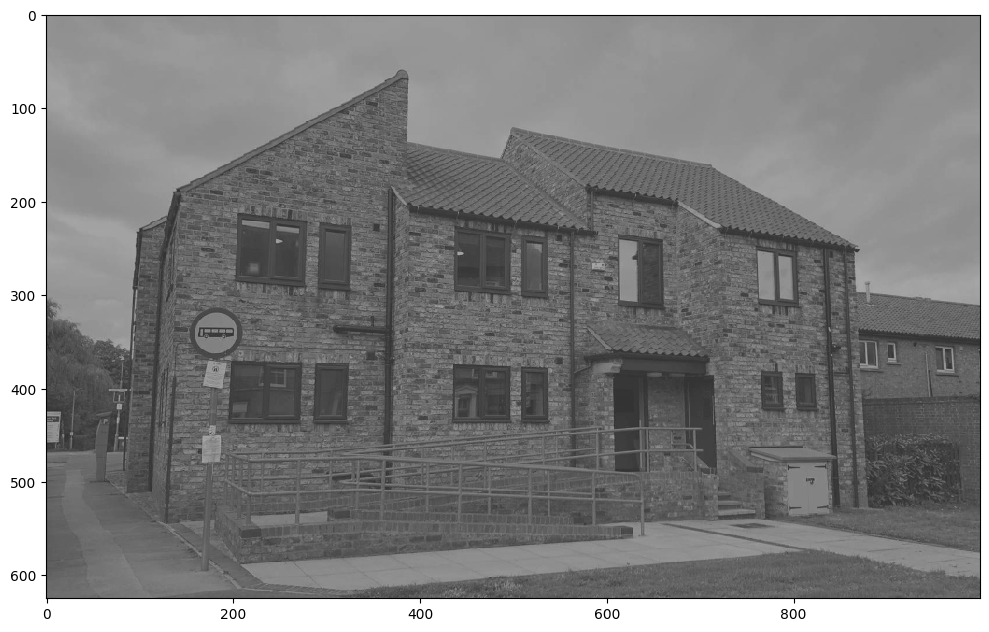

In [ ]:
# To test your implementation, contrast strech the degraded image I_degrade
r1 = 0.3
r2 = 0.7
s1 = 0.2
s2 = 0.8
I_stretched = piecewise_contrast_stretch(I_degraded, r1, r2, s1, s2)

# Display the strtched image

### BEGIN SOLUTION
io.imshow(I_stretched)
### END SOLUTION

# Task 2 - Histogram and Equalization


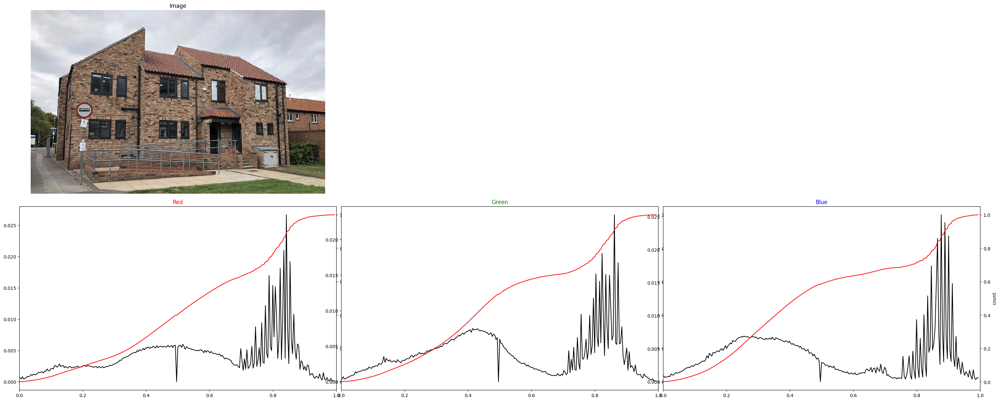

In [ ]:
# Plot the Image and its histogram + cdf of the original image I
# Note that it is a color image, so it will have three different histograms

### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (30, 12)

plt.subplot(2, 3, 1)
io.imshow(I)
plt.axis("off")
plt.title("Image")

for i in range(3):
  plt.subplot(2, 3, i+4)
  hist, bins_hist = exposure.histogram(I[:,:,i].ravel(), nbins=256, normalize=True)
  plt.plot(bins_hist, hist, color="black")

  cdf, bins_cdf = exposure.cumulative_distribution(I[:,:,i].ravel(), nbins=256)
  plt.twinx()
  plt.plot(bins_cdf, cdf, color="red")

  plt.xlim([0, 1])

  plt.xlabel("pixel values")
  plt.ylabel("count")

  if i == 0:
    plt.title("Red", color="red")
  elif i == 1:
    plt.title("Green", color="green")
  else:
    plt.title("Blue", color="blue")

plt.show()
### END SOLUTION

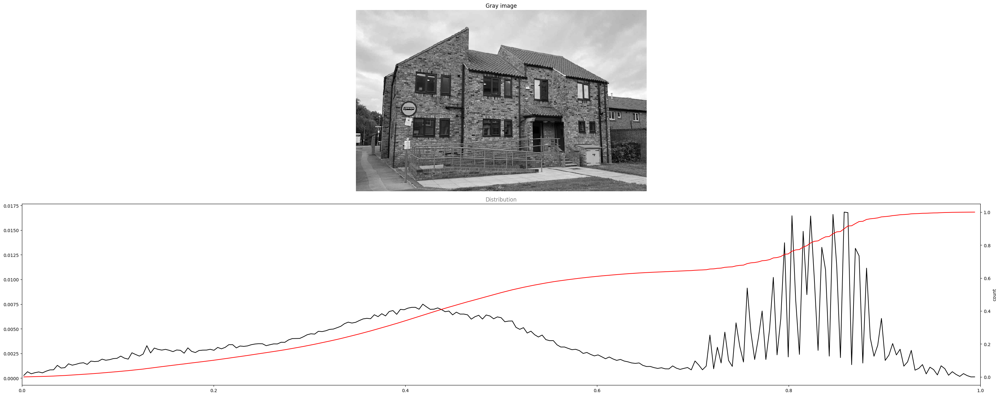

In [ ]:
# Plot the Image and its histogram + cdf of the grayscale image I_gray

### BEGIN SOLUTION
# plt.rcParams['figure.figsize'] = (30, 12)

plt.subplot(2, 1, 1)
io.imshow(I_gray)
plt.axis("off")
plt.title("Gray image")


plt.subplot(2, 1, 2)
hist, bins_hist = exposure.histogram(I_gray.ravel(), nbins=256, normalize=True)
plt.plot(bins_hist, hist, color="black")

cdf, bins_cdf = exposure.cumulative_distribution(I_gray.ravel(), nbins=256)
plt.twinx()
plt.plot(bins_cdf, cdf, color="red")

plt.xlim([0, 1])

plt.xlabel("pixel values")
plt.ylabel("count")
plt.title("Distribution", color="gray")

plt.show()
### END SOLUTION

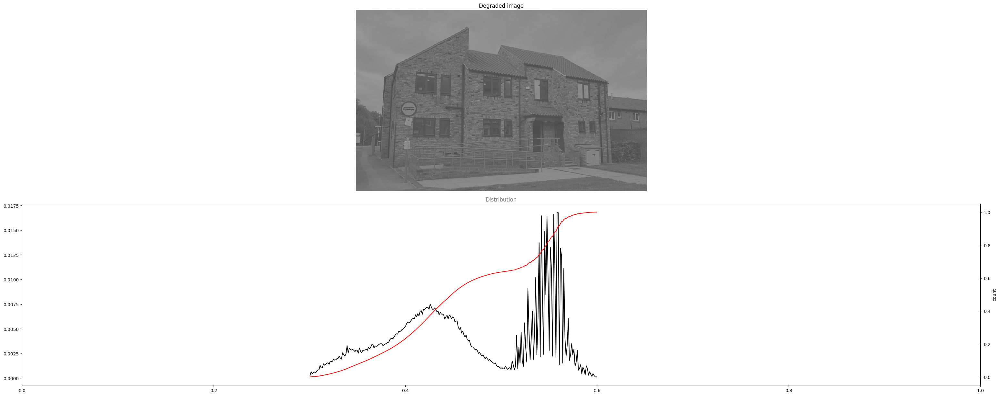

In [ ]:
# Plot the Image and its histogram + cdf of the degraded image I_degraded

### BEGIN SOLUTION
plt.subplot(2, 1, 1)
io.imshow(I_degraded)
plt.axis("off")
plt.title("Degraded image")


plt.subplot(2, 1, 2)
hist, bins_hist = exposure.histogram(I_degraded.ravel(), nbins=256, normalize=True)
plt.plot(bins_hist, hist, color="black")

cdf, bins_cdf = exposure.cumulative_distribution(I_degraded.ravel(), nbins=256)
plt.twinx()
plt.plot(bins_cdf, cdf, color="red")

plt.xlim([0, 1])

plt.xlabel("pixel values")
plt.ylabel("count")
plt.title("Distribution", color="gray")

plt.show()
### END SOLUTION

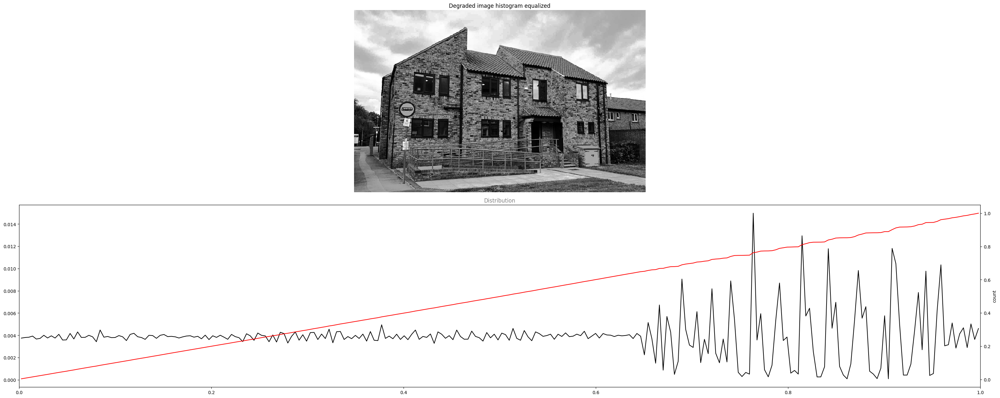

In [ ]:
# Equalize the histogram of the degraded image I_degraded
# Save the result in I_recon_gray, display the image along with its histogram

I_recon_gray = exposure.equalize_hist(I_degraded)

### BEGIN SOLUTION
plt.subplot(2, 1, 1)
io.imshow(I_recon_gray)
plt.axis("off")
plt.title("Degraded image histogram equalized")


plt.subplot(2, 1, 2)
hist, bins_hist = exposure.histogram(I_recon_gray.ravel(), nbins=256, normalize=True)
plt.plot(bins_hist, hist, color="black")

cdf, bins_cdf = exposure.cumulative_distribution(I_recon_gray.ravel(), nbins=256)
plt.twinx()
plt.plot(bins_cdf, cdf, color="red")

plt.xlim([0, 1])

plt.xlabel("pixel values")
plt.ylabel("count")
plt.title("Distribution", color="gray")

plt.show()
### END SOLUTION

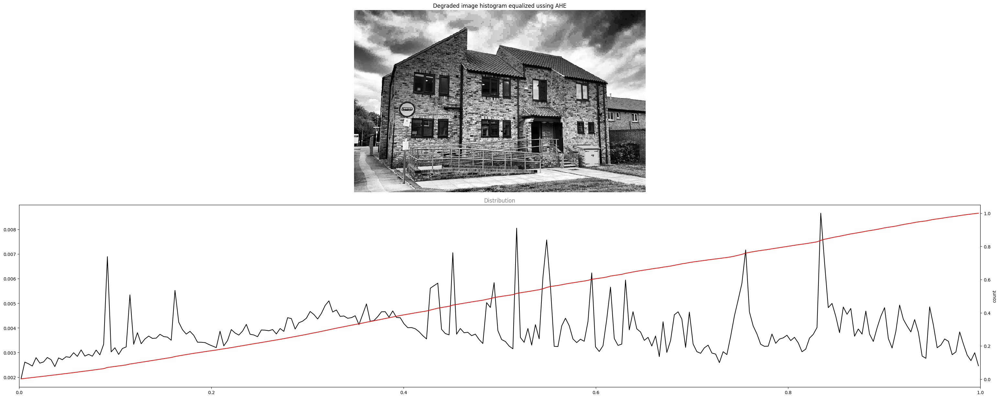

In [ ]:
# Equalize the histogram of the degraded image I_degraded using AHE
# Save the result in I_recon_gray_2, display the image along with its histogram

I_recon_gray_2 = exposure.equalize_adapthist(I_degraded, kernel_size=(256, 256), clip_limit=0)
### BEGIN SOLUTION
plt.subplot(2, 1, 1)
io.imshow(I_recon_gray_2)
plt.axis("off")
plt.title("Degraded image histogram equalized ussing AHE")


plt.subplot(2, 1, 2)
hist, bins_hist = exposure.histogram(I_recon_gray_2.ravel(), nbins=256, normalize=True)
plt.plot(bins_hist, hist, color="black")

cdf, bins_cdf = exposure.cumulative_distribution(I_recon_gray_2.ravel(), nbins=256)
plt.twinx()
plt.plot(bins_cdf, cdf, color="red")

plt.xlim([0, 1])

plt.xlabel("pixel values")
plt.ylabel("count")
plt.title("Distribution", color="gray")

plt.show()
### END SOLUTION

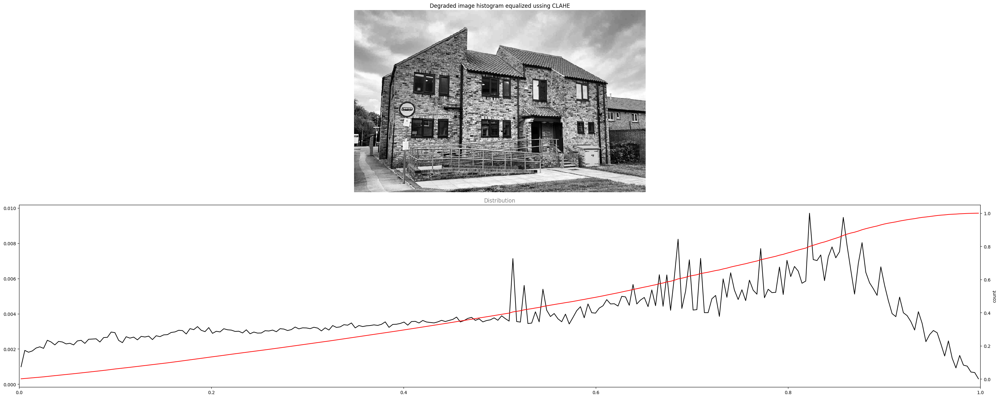

In [ ]:
# Equalize the histogram of the degraded image I_degraded using CLAHE
# Save the result in I_recon_gray_2, display the image along with its histogram

I_recon_gray_3 = exposure.equalize_adapthist(I_degraded, kernel_size=(256, 256), clip_limit=0.01)

### BEGIN SOLUTION
plt.subplot(2, 1, 1)
io.imshow(I_recon_gray_3)
plt.axis("off")
plt.title("Degraded image histogram equalized ussing CLAHE")


plt.subplot(2, 1, 2)
hist, bins_hist = exposure.histogram(I_recon_gray_3.ravel(), nbins=256, normalize=True)
plt.plot(bins_hist, hist, color="black")

cdf, bins_cdf = exposure.cumulative_distribution(I_recon_gray_3.ravel(), nbins=256)
plt.twinx()
plt.plot(bins_cdf, cdf, color="red")

plt.xlim([0, 1])

plt.xlabel("pixel values")
plt.ylabel("count")
plt.title("Distribution", color="gray")

plt.show()
### END SOLUTION

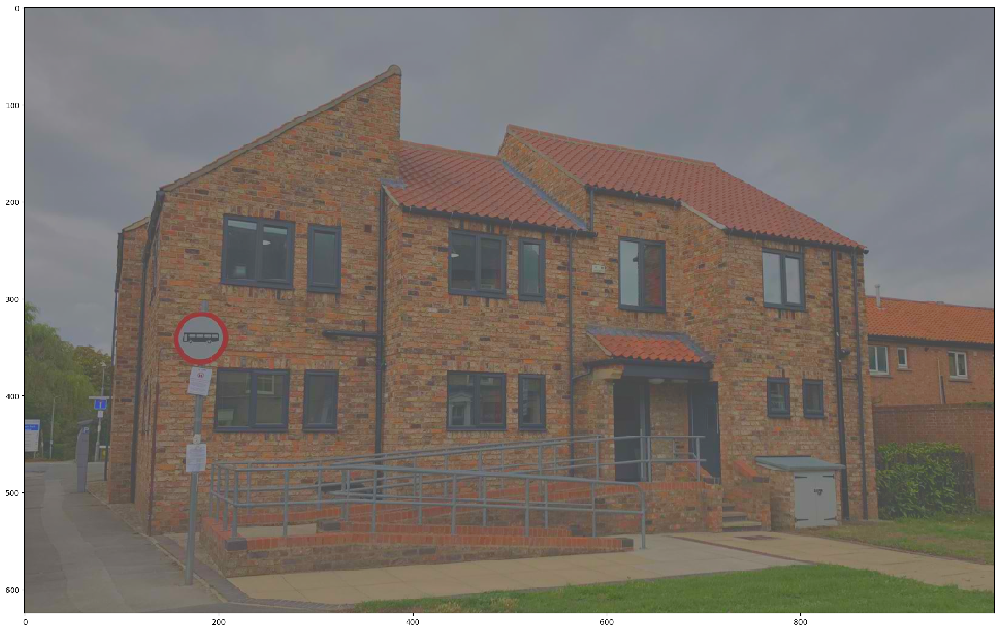

In [ ]:
# Artificially degrade the original **RGB image** by reducing it contrast
# You can do so by recaling the values of the L channel (in LAB color space)
# and concentrating them in a narrow range, say between 0.3 and 0.6.
# Save the image as I_rgb_degraded and display it

I_LAB = color.rgb2lab(I)

### BEGIN SOLUTION
I_LAB[:, :, 0] /= 100
I_LAB[:, :, 0] = exposure.rescale_intensity(I_LAB[:, :, 0], in_range=(0, 1), out_range=(0.3, 0.6))
I_LAB[:, :, 0] *= 100
I_rgb_degraded = color.lab2rgb(I_LAB)

io.imshow(I_rgb_degraded)
### END SOLUTION

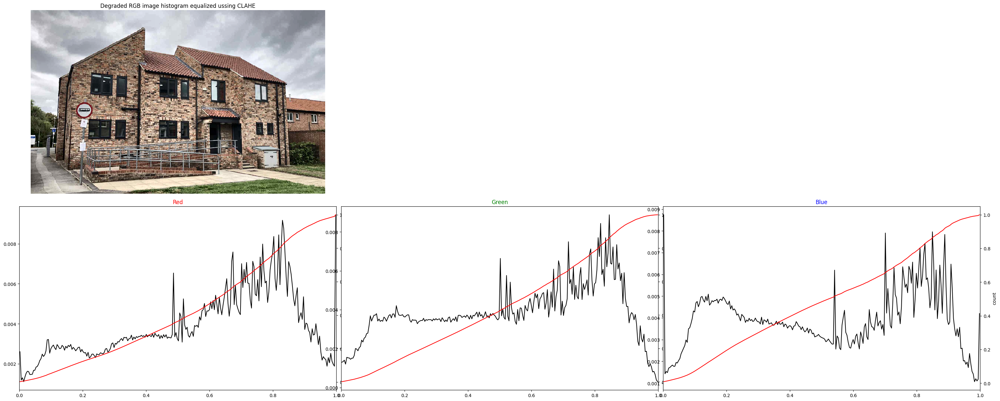

In [ ]:
# Equalize the histogram of the degraded color image I_rgb_degraded using CLAHE
# Save the result in I_recon_color, display the image along with its histogram
# HINT: You have to convert to LAB first
# See the lecture and lecture-4-demo-codes

### BEGIN SOLUTION
I_rgb_degraded_LAB = color.rgb2lab(I_rgb_degraded)
I_rgb_degraded_LAB[:,:,0] /= 100
I_rgb_degraded_LAB[:,:,0] = exposure.equalize_adapthist(I_rgb_degraded_LAB[:,:,0], kernel_size=(256, 256), clip_limit=0.01)
I_rgb_degraded_LAB[:,:,0] *= 100
I_recon_color = color.lab2rgb(I_rgb_degraded_LAB)


plt.rcParams['figure.figsize'] = (30, 12)

plt.subplot(2, 3, 1)
io.imshow(I_recon_color)
plt.axis("off")
plt.title("Degraded RGB image histogram equalized ussing CLAHE")

for i in range(3):
  plt.subplot(2, 3, i+4)
  hist, bins_hist = exposure.histogram(I_recon_color[:,:,i].ravel(), nbins=256, normalize=True)
  plt.plot(bins_hist, hist, color="black")

  cdf, bins_cdf = exposure.cumulative_distribution(I_recon_color[:,:,i].ravel(), nbins=256)
  plt.twinx()
  plt.plot(bins_cdf, cdf, color="red")

  plt.xlim([0, 1])

  plt.xlabel("pixel values")
  plt.ylabel("count")

  if i == 0:
    plt.title("Red", color="red")
  elif i == 1:
    plt.title("Green", color="green")
  else:
    plt.title("Blue", color="blue")

plt.show()
### END SOLUTION

# Task 3 - Open Ended

## **_There are 3 images in the drive directory below. Look at the questions from the brackets [.]. Answer them in the provided text cell at the bottom._**

### link: https://drive.google.com/drive/folders/1ft3XrO-MGxhxL2PfcLCFQjU0wvvlLAv4?usp=sharing


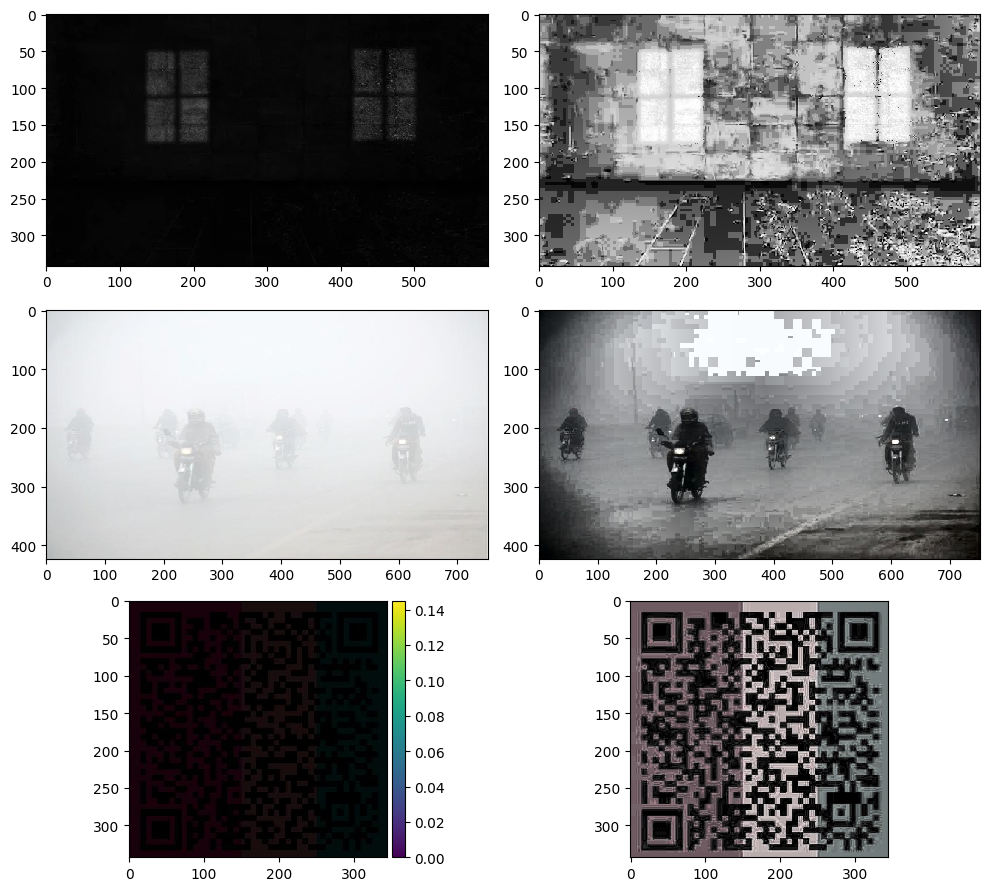

In [ ]:
# Dark_Room.jpg = very dark [The windows are on walls. How does the wall look like?]
# Foggy_Road.jpg = washed out/foggy [How many vehicles do you think there are?]
# Read_the_code.jpg = Dark RGB Barcode [What is hidden in the Barcode?
#                                       Make it scanable, scan it and say something about the hidden message.]

# Your task is to improve these images using
# contrast stretching, histogram equalization, AHE or CLAHE
# try different combination of parameter settings to see which produces the best result

### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (10, 9)

def analyze(img_path, plot_no, algo_choice, clip_limit = 0):
  img = img_as_float(io.imread(img_path))

  if img.shape[0] > 1000 or img.shape[1] > 1000:
    img = transform.rescale(img, 1000/max(img.shape[0], img.shape[1]), anti_aliasing=True, channel_axis=-1)

  plt.subplot(3, 2, plot_no)
  io.imshow(img)

  img_LAB = color.rgb2lab(img)
  img_LAB[:,:,0] /= 100

  if algo_choice == 1:  # contrast stretching
    img_LAB[:,:,0] = np.clip((img_LAB[:,:,0] - img_LAB[:,:,0].min()) / (img_LAB[:,:,0].max() - img_LAB[:,:,0].min()), 0, 1)
  elif algo_choice == 2:  # histogram equalization
    img_LAB[:,:,0] = exposure.equalize_hist(img_LAB[:,:,0])
  elif algo_choice == 3:  # AHE
    img_LAB[:,:,0] = exposure.equalize_adapthist(img_LAB[:,:,0], kernel_size=(256, 256), clip_limit=0)
  elif algo_choice == 4:  # CLAHE
    img_LAB[:,:,0] = exposure.equalize_adapthist(img_LAB[:,:,0], kernel_size=(256, 256), clip_limit=clip_limit)

  img_LAB[:,:,0] *= 100
  img = color.lab2rgb(img_LAB)
  plt.subplot(3, 2, plot_no + 1)
  io.imshow(img)


analyze("/content/Dark_Room.jpg", 1, 3)
analyze("/content/Foggy_Road.jpg", 3, 3)
analyze("/content/Read_the_code.jpg", 5, 4, 0.01)

plt.show()
# io.imshow(img_as_float(io.imread("/content/Read_the_code.jpg")))

### END SOLUTION

### Your answers:

- From the "Dark_Room.jpg" image, it looks like there are some blocks in the wall. I suppose the wall is tiled.

- From the "Foggy_Road.jpg" image, it seems there are 9 vehicles in total (1 car and 8 bikes). Though it is unclear whether there is a bike behind the rightmost bike.

- The QR code contains a link (https://docs.google.com/document/d/1Y3Z_DvDcCJG9a0C4N4CMfX4KM5wGP-cxBekb8WT2cfg/edit#heading=h.o4v8u). The links has Theory References & Practice Problems of CSE428: Image Processing.


In [ ]:
#End